# Introduction
Welcome to the first submission notebook for Playground Series S3E14.

Wild blueberries are a type of small, dark-blue fruit that grows on low-lying shrubs in regions with acidic soil and a cool climate. They are known for their high antioxidant content and are used in a variety of food products, including baked goods, smoothies, and jams.

The features in this dataset provide information about the environmental conditions that can affect the yield of wild blueberries. The clone size of the blueberry plants, as well as the density of honeybees, bumblebees, Andrena bees, and Osmia bees in the field, can all impact the pollination and fruit set of the plants. The temperature range during the bloom season is also an important factor, with both the upper and lower band daily air temperature affecting plant growth and development. In addition, the amount of rainfall during the bloom season can impact fruit yield.

By building a machine learning model that takes these features into account, we can predict the yield of wild blueberries in different regions and under different environmental conditions. This can help farmers make more informed decisions about when to plant, harvest, and market their crops, as well as identify factors that may be limiting the yield in certain regions.

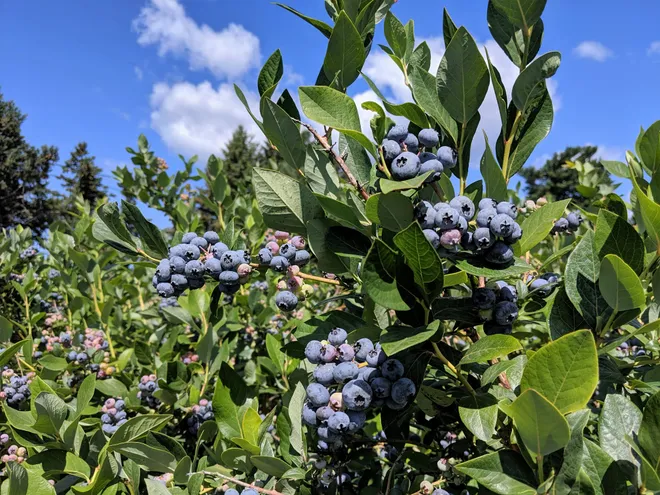

Source:https://www.gannett-cdn.com/presto/2021/03/09/NHOS/71c5c7f5-0559-4876-8b1d-b62de331b98d-2.jpeg?width=660&height=495&fit=crop&format=pjpg&auto=webp

##### Evaluation:
Submissions will be evaluated using Mean Absolute Error (MAE),
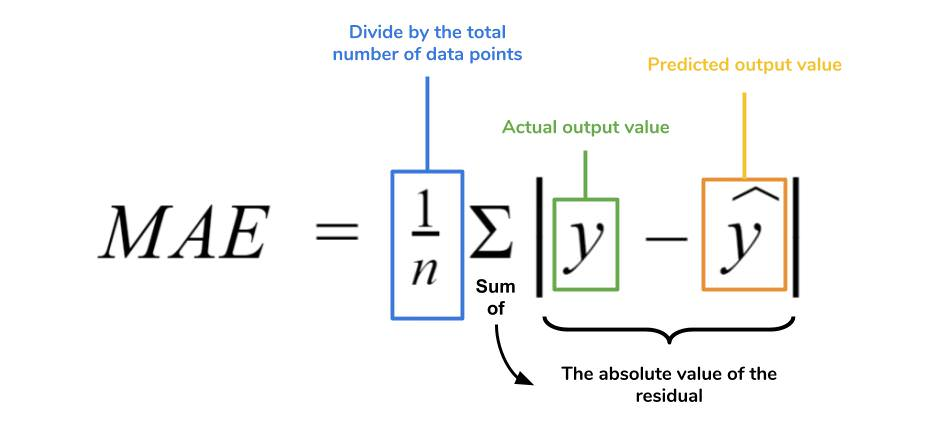


In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt 
import seaborn as sns

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/playground-series-s3e14/sample_submission.csv
/kaggle/input/playground-series-s3e14/train.csv
/kaggle/input/playground-series-s3e14/test.csv


# S0: Basic Analysis

Import:

In [2]:
df_train = pd.read_csv("/kaggle/input/playground-series-s3e14/train.csv")
df_test = pd.read_csv("/kaggle/input/playground-series-s3e14/test.csv")

Checking the first 5 rows:

In [3]:
df_train.head()

,id,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417


### Features:
* **Clonesize(m2)**: The average blueberry clone size in the field
* **Honeybee (bees/m2/min)**: Honeybee density in the field
* **Bumbles (bees/m2/min)**: Bumblebee density in the field
* **Andrena (bees/m2/min)**: Andrena bee density in the field
* **Osmia (bees/m2/min)**: Osmia bee density in the field
* **MaxOfUpperTRange (℃)**: The highest record of the upper band daily air temperature during the bloom season
* **MinOfUpperTRange (℃)**: The lowest record of the upper band daily air temperature7.
* **AverageOfUpperTRange (℃)**: The average of the upper band daily air temperature
* **MaxOfLowerTRange (℃)**: The highest record of the lower band daily air temperature
* **MinOfLowerTRange (℃)**: The lowest record of the lower band daily air temperature
* **AverageOfLowerTRange (℃)**: The average of the lower band daily air temperature
* **RainingDays**: Day The total number of days during the bloom season, each of which has precipitation larger than zero
* **AverageRainingDays**: Day The average of raining days of the entire bloom season

In [4]:
#dimensions
df_train.shape

(15289, 18)

In [5]:
#Dropping id as it is redundant
df_train = df_train.drop("id",axis=1)

Summary statistics:

In [6]:
df_train.describe()

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
count,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000,15289.000000
mean,19.704690,0.389314,0.286768,0.492675,0.592355,82.169887,49.673281,68.656256,59.229538,28.660553,48.568500,18.660865,0.324176,0.502741,0.446553,36.164950,6025.193999
std,6.595211,0.361643,0.059917,0.148115,0.139489,9.146703,5.546405,7.641807,6.610640,3.195367,5.390545,11.657582,0.163905,0.074390,0.037035,4.031087,1337.056850
min,10.000000,0.000000,0.000000,0.000000,0.000000,69.700000,39.000000,58.200000,50.200000,24.300000,41.200000,1.000000,0.060000,0.192732,0.311921,22.079199,1945.530610
25%,12.500000,0.250000,0.250000,0.380000,0.500000,77.400000,46.800000,64.700000,55.800000,27.000000,45.800000,16.000000,0.260000,0.458246,0.419216,33.232449,5128.163510
50%,25.000000,0.500000,0.250000,0.500000,0.630000,86.000000,52.000000,71.900000,62.000000,30.000000,50.800000,16.000000,0.260000,0.506600,0.446570,36.040675,6117.475900
75%,25.000000,0.500000,0.380000,0.630000,0.750000,86.000000,52.000000,71.900000,62.000000,30.000000,50.800000,24.000000,0.390000,0.560445,0.474134,39.158238,7019.694380
max,40.000000,18.430000,0.585000,0.750000,0.750000,94.600000,57.200000,79.000000,68.200000,33.000000,55.900000,34.000000,0.560000,0.652144,0.535660,46.585105,8969.401840


Datatypes:

In [7]:
df_train.dtypes

clonesize               float64
honeybee                float64
bumbles                 float64
andrena                 float64
osmia                   float64
MaxOfUpperTRange        float64
MinOfUpperTRange        float64
AverageOfUpperTRange    float64
MaxOfLowerTRange        float64
MinOfLowerTRange        float64
AverageOfLowerTRange    float64
RainingDays             float64
AverageRainingDays      float64
fruitset                float64
fruitmass               float64
seeds                   float64
yield                   float64
dtype: object

Missing rows checking:

In [8]:
df_train.isnull().sum()

clonesize               0
honeybee                0
bumbles                 0
andrena                 0
osmia                   0
MaxOfUpperTRange        0
MinOfUpperTRange        0
AverageOfUpperTRange    0
MaxOfLowerTRange        0
MinOfLowerTRange        0
AverageOfLowerTRange    0
RainingDays             0
AverageRainingDays      0
fruitset                0
fruitmass               0
seeds                   0
yield                   0
dtype: int64

Duplicated:

In [9]:
df_train.duplicated().sum()

7

### !Remarks: These duplicated rows are redundant, and may create problems such as overfitting, and increment in bias of the model

In [10]:
df_train[df_train.drop(columns=['yield']).duplicated()]

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
3380,25.0,0.50,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,16.0,0.26,0.514303,0.454917,36.682588,6157.05484
4439,12.5,0.25,0.25,0.25,0.75,77.4,46.8,64.7,55.8,27.0,45.8,1.0,0.10,0.629606,0.521692,44.721635,8298.20697
8060,12.5,0.25,0.38,0.50,0.75,77.4,46.8,64.7,55.8,27.0,45.8,1.0,0.10,0.641618,0.529619,45.718182,8743.52098
9219,37.5,0.75,0.25,0.25,0.25,77.4,46.8,64.7,55.8,27.0,45.8,34.0,0.56,0.284443,0.352186,26.101179,2625.26916
9424,12.5,0.25,0.25,0.38,0.75,86.0,52.0,71.9,62.0,30.0,50.8,16.0,0.26,0.601354,0.496997,41.484534,7732.22522
10772,25.0,0.50,0.38,0.38,0.50,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.421630,0.414273,32.158685,4393.52743
11046,25.0,0.50,0.38,0.63,0.50,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.363726,0.391442,29.739992,3631.90544
12589,37.5,0.75,0.25,0.25,0.25,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.354086,0.388136,29.373012,3712.99786
12776,12.5,0.25,0.25,0.25,0.75,94.6,57.2,79.0,68.2,33.0,55.9,1.0,0.10,0.627858,0.520974,44.623966,8211.07950
13563,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.583379,0.484792,40.037644,7483.73632


In [11]:
df_train.drop_duplicates()

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15284,12.5,0.25,0.25,0.38,0.50,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.556302,0.476308,40.546480,7667.83619
15285,12.5,0.25,0.25,0.25,0.50,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.354413,0.388145,29.467434,3680.56025
15286,25.0,0.50,0.25,0.38,0.75,77.4,46.8,64.7,55.8,27.0,45.8,34.0,0.56,0.422548,0.416786,32.299059,4696.44394
15287,25.0,0.50,0.25,0.63,0.63,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.542170,0.434133,36.674243,6772.93347


# S1: Exploratory Data Analysis

In [12]:
import ydata_profiling as pp
profile = pp.ProfileReport(df_train)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

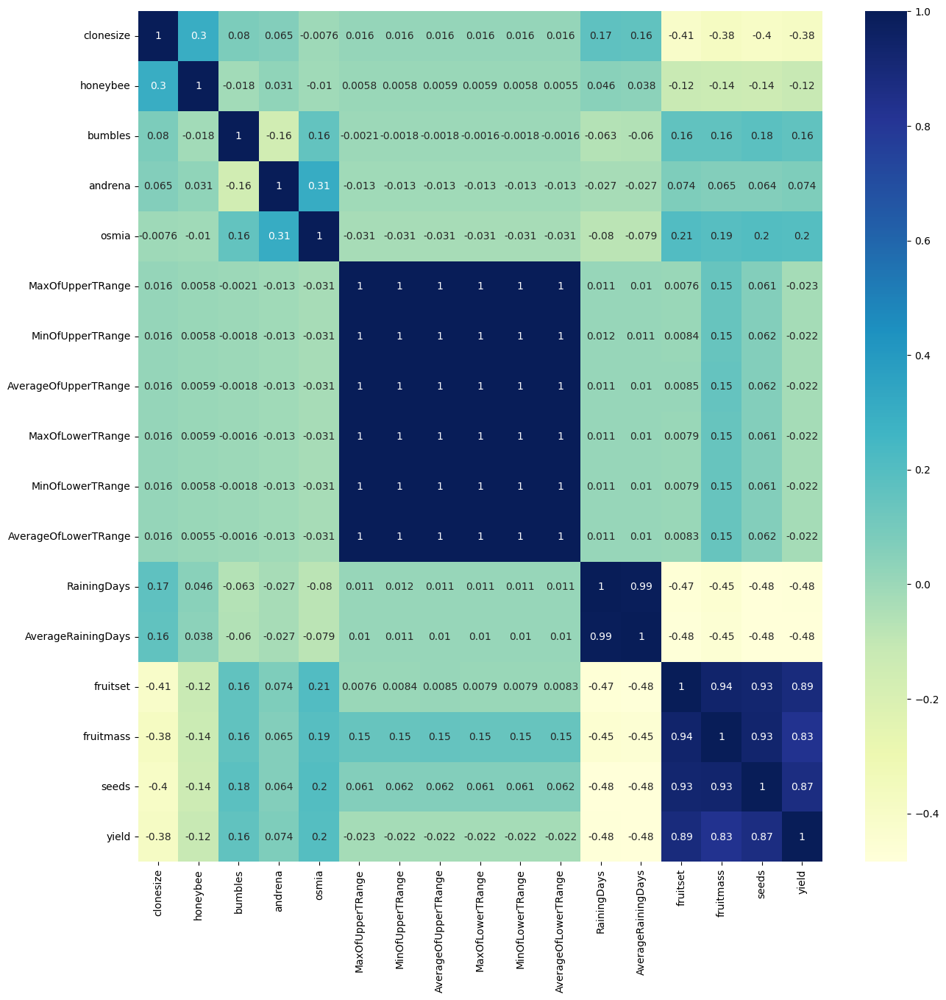

In [13]:
plt.figure(figsize=(15,15))
dataplot = sns.heatmap(df_train.corr(), cmap="YlGnBu", annot=True)

### !Important Remarks:
1. There are 8 features which are positively correlated (Pearson's corr. coeff = +1), 6 of which are connected to temperature ranges, and other 2 are related to days it rained during the bloom season.
2. These features are providing the exact same information; is recommended to remove some of these features to avoid the problem of multicollinearity, which can negatively impact the performance of our model.

    (Multicollinearity refers to the situation where two or more independent variables in a regression model are highly correlated with each other, making it difficult to determine their individual effects on the dependent variable. This can lead to unstable and unreliable coefficient estimates, and can make it difficult to interpret the results of the model.)

3. We can feature engineer these features into just two columns

In [14]:
df_train

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds,yield
0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887,4476.81146
1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317,5548.12201
2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781,6869.77760
3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561,6880.77590
4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512,7479.93417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15284,12.5,0.25,0.25,0.38,0.50,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.556302,0.476308,40.546480,7667.83619
15285,12.5,0.25,0.25,0.25,0.50,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.354413,0.388145,29.467434,3680.56025
15286,25.0,0.50,0.25,0.38,0.75,77.4,46.8,64.7,55.8,27.0,45.8,34.0,0.56,0.422548,0.416786,32.299059,4696.44394
15287,25.0,0.50,0.25,0.63,0.63,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.542170,0.434133,36.674243,6772.93347


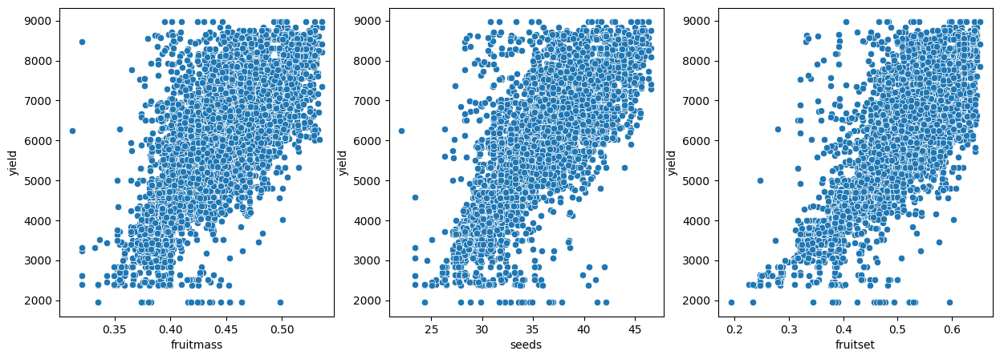

In [15]:
fig, axs = plt.subplots(ncols=3, figsize=(15,5))

sns.scatterplot(ax=axs[0], data=df_train, x='fruitmass', y='yield')
sns.scatterplot(ax=axs[1], data=df_train, x='seeds', y='yield')
sns.scatterplot(ax=axs[2], data=df_train, x='fruitset', y='yield')

plt.show()

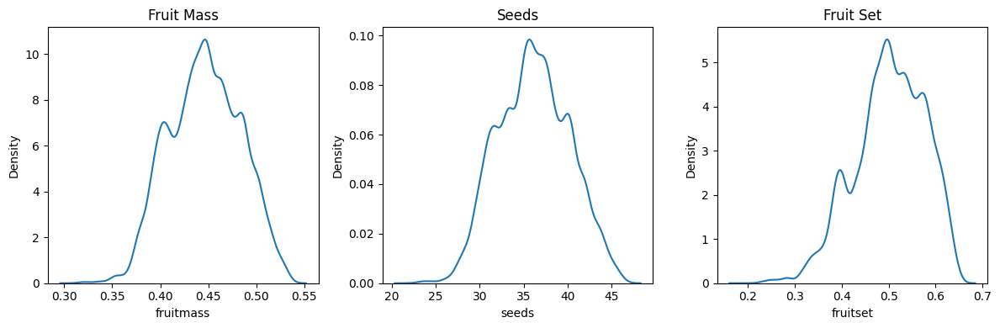

In [16]:
# Set up the subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

# Create the kernel density plots for each column
sns.kdeplot(df_train["fruitmass"], ax=axes[0])
sns.kdeplot(df_train["seeds"], ax=axes[1])
sns.kdeplot(df_train["fruitset"], ax=axes[2])

# Set the titles for each subplot
axes[0].set_title('Fruit Mass')
axes[1].set_title('Seeds')
axes[2].set_title('Fruit Set')

# Show the subplots
plt.tight_layout()
plt.show()

#### Skewness and kurtosis: 
Skewness refers to the degree of asymmetry in a distribution. A perfectly symmetrical distribution will have a skewness of 0, while a positive skewness indicates that the tail of the distribution extends towards the right and a negative skewness indicates that the tail of the distribution extends towards the left. Skewness can be important because it can affect the accuracy of certain statistical tests that assume a normal distribution.

Kurtosis, on the other hand, refers to the degree of peakedness or flatness of a distribution. A normal distribution has a kurtosis of 3 (referred to as mesokurtic), while a distribution with a higher peak and more concentrated data around the mean will have positive kurtosis (referred to as leptokurtic), and a flatter distribution with less concentrated data around the mean will have negative kurtosis (referred to as platykurtic). Kurtosis can also affect the accuracy of certain statistical tests, especially those that assume normality,

In [17]:
print(df_train.fruitset.kurt())
print(df_train.fruitset.skew())

-0.16973179994298881
-0.42660561954580783


In [18]:
print(df_train.fruitmass.kurt())
print(df_train.fruitmass.skew())

-0.562269257597892
-0.05553138164943954


In [19]:
print(df_train.seeds.kurt())
print(df_train.seeds.skew())

-0.5182314021572676
0.0153871221345227


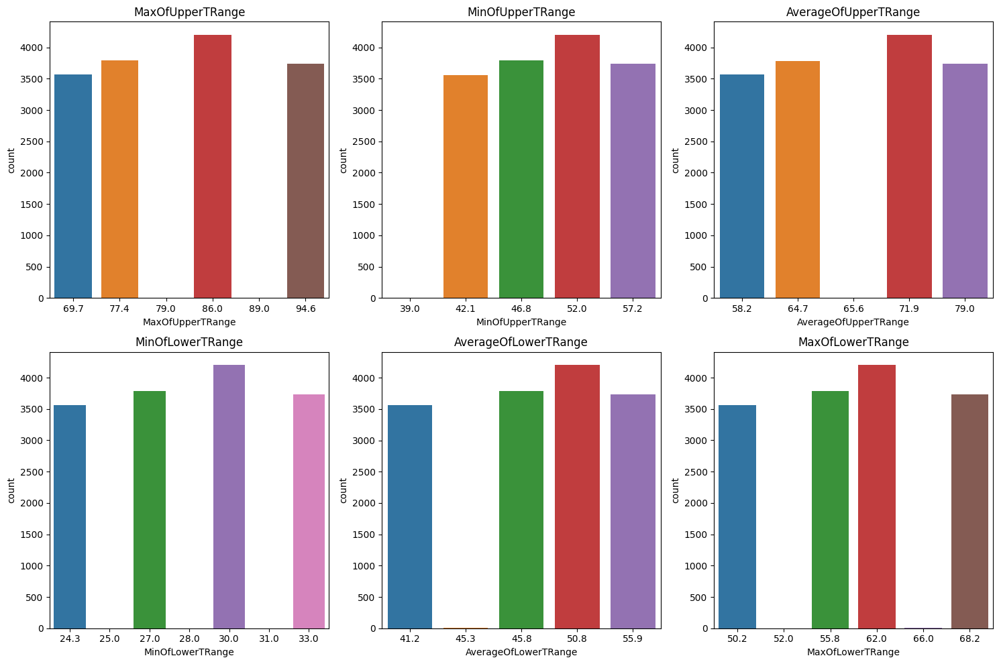

In [20]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15,10))

sns.countplot(x=df_train["MaxOfUpperTRange"], ax=axes[0,0])
axes[0,0].set_title("MaxOfUpperTRange")

sns.countplot(x=df_train["MinOfUpperTRange"], ax=axes[0,1])
axes[0,1].set_title("MinOfUpperTRange")

sns.countplot(x=df_train["AverageOfUpperTRange"], ax=axes[0,2])
axes[0,2].set_title("AverageOfUpperTRange")

sns.countplot(x=df_train["MinOfLowerTRange"], ax=axes[1,0])
axes[1,0].set_title("MinOfLowerTRange")

sns.countplot(x=df_train["AverageOfLowerTRange"], ax=axes[1,1])
axes[1,1].set_title("AverageOfLowerTRange")

sns.countplot(x=df_train["MaxOfLowerTRange"], ax=axes[1,2])
axes[1,2].set_title("MaxOfLowerTRange")

plt.tight_layout()
plt.show()

### !Important Remarks:
1. fruitmass, fruitset, and seeds have similar scatterplots
2. Temperature min, max and average have same values, hence feature engineering may give them some new results and improvement to the model

# S2: Feature Selection and Engineering

In [21]:
y = df_train["yield"]
X = df_train.drop("yield",axis = 1)

In [22]:
X

,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds
0,25.0,0.50,0.25,0.75,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.425011,0.417545,32.460887
1,25.0,0.50,0.25,0.50,0.50,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.444908,0.422051,33.858317
2,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.552927,0.470853,38.341781
3,12.5,0.25,0.25,0.63,0.50,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.565976,0.478137,39.467561
4,25.0,0.50,0.25,0.63,0.63,77.4,46.8,64.7,55.8,27.0,45.8,24.0,0.39,0.579677,0.494165,40.484512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15284,12.5,0.25,0.25,0.38,0.50,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.556302,0.476308,40.546480
15285,12.5,0.25,0.25,0.25,0.50,86.0,52.0,71.9,62.0,30.0,50.8,34.0,0.56,0.354413,0.388145,29.467434
15286,25.0,0.50,0.25,0.38,0.75,77.4,46.8,64.7,55.8,27.0,45.8,34.0,0.56,0.422548,0.416786,32.299059
15287,25.0,0.50,0.25,0.63,0.63,69.7,42.1,58.2,50.2,24.3,41.2,24.0,0.39,0.542170,0.434133,36.674243


Feature engineered the temperature ranges, and raining days by summing them and placing their result in a new column:

In [23]:
temp_cols = [col for col in X.columns if 'TRange' in col]
rain_cols = [col for col in X.columns if 'RainingDays' in col]

X['Temp'] = X[temp_cols].sum(axis=1)
X['Rain'] = X[rain_cols].sum(axis=1)
X.drop(columns=temp_cols+rain_cols, inplace=True)

In [24]:
X

,clonesize,honeybee,bumbles,andrena,osmia,fruitset,fruitmass,seeds,Temp,Rain
0,25.0,0.50,0.25,0.75,0.50,0.425011,0.417545,32.460887,285.7,24.39
1,25.0,0.50,0.25,0.50,0.50,0.444908,0.422051,33.858317,285.7,24.39
2,12.5,0.25,0.25,0.63,0.63,0.552927,0.470853,38.341781,352.7,24.39
3,12.5,0.25,0.25,0.63,0.50,0.565976,0.478137,39.467561,317.5,24.39
4,25.0,0.50,0.25,0.63,0.63,0.579677,0.494165,40.484512,317.5,24.39
...,...,...,...,...,...,...,...,...,...,...
15284,12.5,0.25,0.25,0.38,0.50,0.556302,0.476308,40.546480,317.5,16.26
15285,12.5,0.25,0.25,0.25,0.50,0.354413,0.388145,29.467434,352.7,34.56
15286,25.0,0.50,0.25,0.38,0.75,0.422548,0.416786,32.299059,317.5,34.56
15287,25.0,0.50,0.25,0.63,0.63,0.542170,0.434133,36.674243,285.7,24.39


# S3: Mutual Information


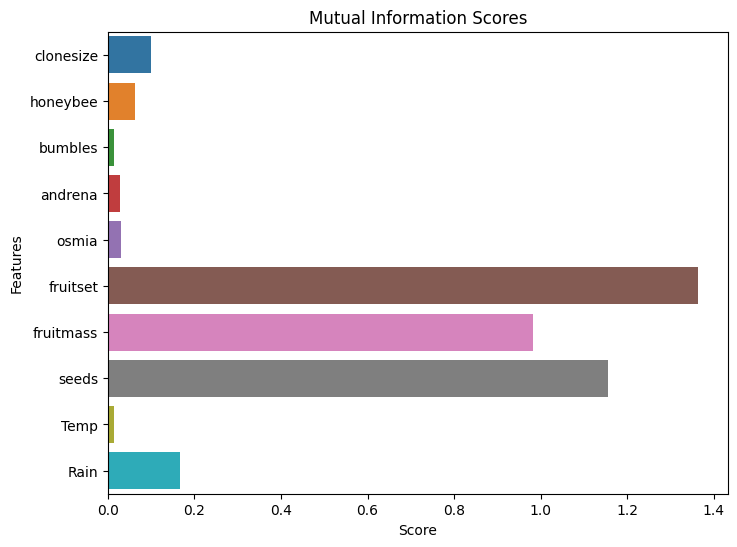

In [25]:
from sklearn.feature_selection import mutual_info_regression

# Compute mutual information
mi_scores = mutual_info_regression(X, y)

fig, ax = plt.subplots(figsize=(8, 6))
sns.barplot(x=mi_scores, y=X.columns, ax=ax)

ax.set_title('Mutual Information Scores')
ax.set_xlabel('Score')
ax.set_ylabel('Features')
plt.show()

In [26]:
for i, score in enumerate(mi_scores):
    print(f"Feature {i}: {score:.3f}")

Feature 0: 0.100
Feature 1: 0.063
Feature 2: 0.014
Feature 3: 0.027
Feature 4: 0.031
Feature 5: 1.364
Feature 6: 0.983
Feature 7: 1.156
Feature 8: 0.013
Feature 9: 0.166


# S4: Modelling (Base Approach)

### Train and validation sets splits:

In [27]:
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_absolute_error
import lightgbm as lgb
import xgboost as xgb
from sklearn.ensemble import GradientBoostingRegressor

In [28]:
X_train,X_valid,y_train,y_valid = train_test_split(X,y,test_size=0.2)

In [29]:
print(X_train.shape)
print(X_valid.shape)

(12231, 10)
(3058, 10)


In [30]:
#ML Models and hyperparameters
models = {
    'LightGBM': lgb.LGBMRegressor(num_leaves=31, learning_rate=0.05, n_estimators=100),
    'XGBoost': xgb.XGBRegressor(max_depth=5, learning_rate=0.1, n_estimators=100),
    'GBRT': GradientBoostingRegressor(max_depth=5, learning_rate=0.1, n_estimators=100)
}

In [31]:
train_metrics = {
    'MAE': []
}

In [32]:
for model_name, model in models.items():
    model.fit(X_train,y_train)
    y_pred = model.predict(X_valid)
    mae = mean_absolute_error(y_valid,y_pred)
    train_metrics['MAE'].append(mae)

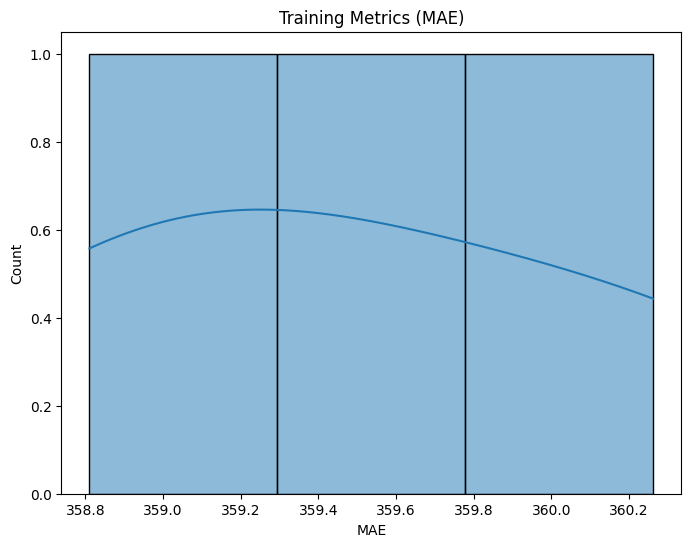

In [33]:
plt.figure(figsize=(8, 6))
sns.histplot(train_metrics['MAE'], kde=True)
plt.title('Training Metrics (MAE)')
plt.xlabel('MAE')
plt.ylabel('Count')
plt.show()

### K-Fold cross validation splits:

In [34]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Define the training metrics to track
train_metrics = {
    'MAE': []
}

Model: LightGBM
     feature  importance
7      seeds       852.0
5   fruitset       814.2
6  fruitmass       494.8
8       Temp       240.6
9       Rain       235.6
4      osmia       106.8
3    andrena        88.8
0  clonesize        72.6
2    bumbles        66.0
1   honeybee        28.6


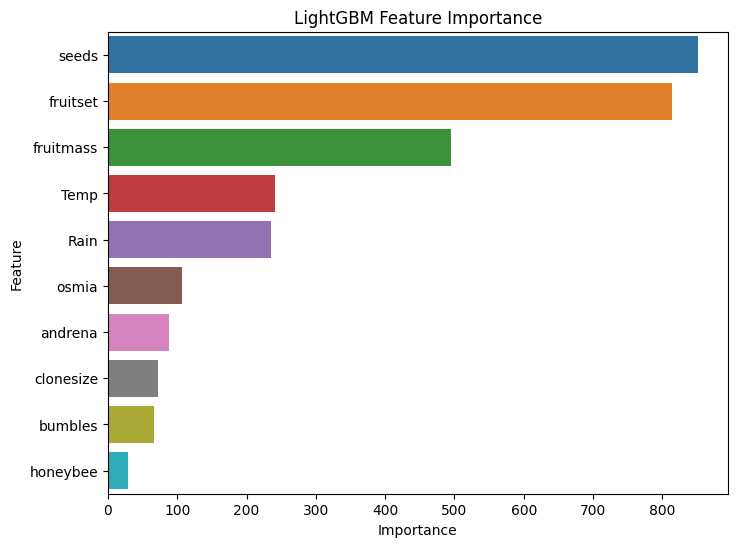

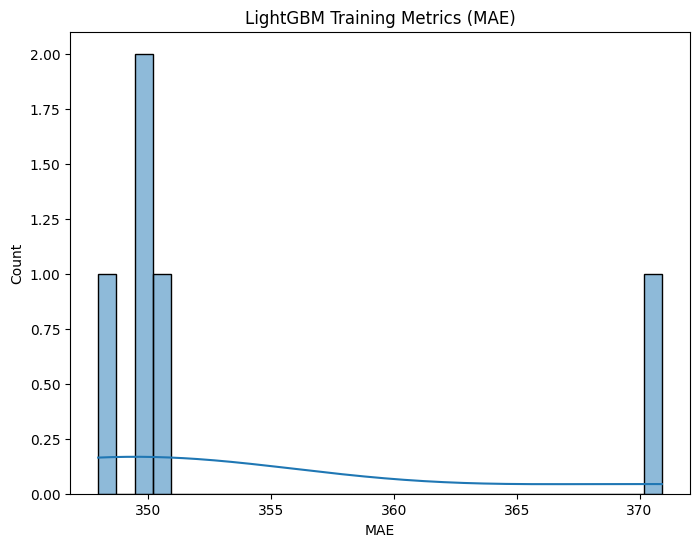

Model: XGBoost
     feature  importance
5   fruitset    0.699727
7      seeds    0.203826
8       Temp    0.018460
9       Rain    0.017887
1   honeybee    0.015481
6  fruitmass    0.011710
4      osmia    0.008898
0  clonesize    0.008713
2    bumbles    0.008403
3    andrena    0.006895


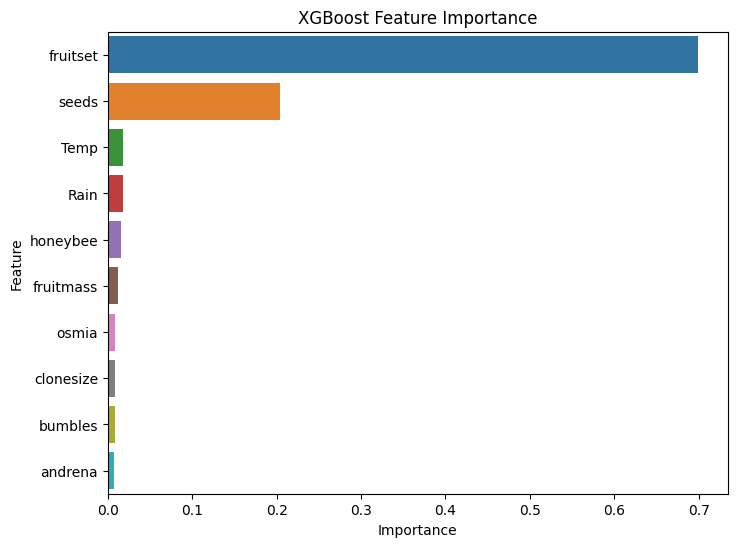

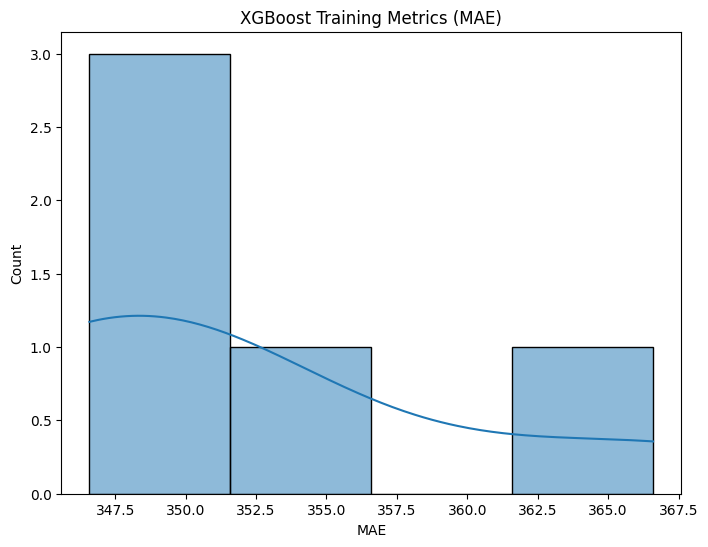

Model: GBRT
     feature  importance
5   fruitset    0.782292
7      seeds    0.185576
6  fruitmass    0.011555
8       Temp    0.007938
9       Rain    0.004433
4      osmia    0.002459
1   honeybee    0.001614
3    andrena    0.001554
0  clonesize    0.001389
2    bumbles    0.001190


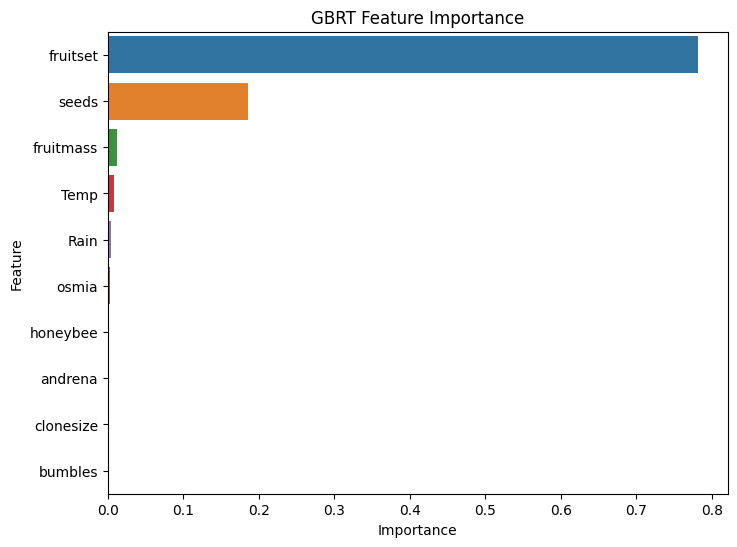

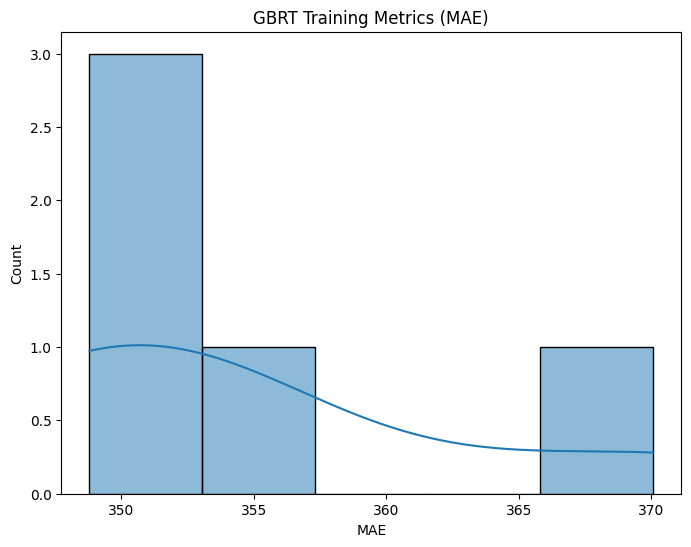

In [35]:
for model_name, model in models.items():
    print(f"Model: {model_name}")
    train_metrics[model_name] = {'MAE': [], 'feature_importance': []}
    
    for train_idx, test_idx in kfold.split(X, y):
        X_train, y_train = X.iloc[train_idx], y.iloc[train_idx]
        X_test, y_test = X.iloc[test_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        mae = mean_absolute_error(y_test, y_pred)
        train_metrics[model_name]['MAE'].append(mae)
        
        train_metrics[model_name]['feature_importance'].append(model.feature_importances_)
        
    # Print feature importance
    feat_importance = np.mean(train_metrics[model_name]['feature_importance'], axis=0)
    feat_importance_df = pd.DataFrame({'feature': X.columns, 'importance': feat_importance})
    feat_importance_df = feat_importance_df.sort_values('importance', ascending=False)
    print(feat_importance_df)
    
    # Plot feature importance
    plt.figure(figsize=(8, 6))
    sns.barplot(x='importance', y='feature', data=feat_importance_df)
    plt.title(f'{model_name} Feature Importance')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()
    
    # Plot the training metrics
    plt.figure(figsize=(8, 6))
    sns.histplot(train_metrics[model_name]['MAE'], kde=True)
    plt.title(f'{model_name} Training Metrics (MAE)')
    plt.xlabel('MAE')
    plt.ylabel('Count')
    plt.show()

### Best MAE : ~350

# S5: Testing Set, Preprocessing and Prediction

In [36]:
df_test

,id,clonesize,honeybee,bumbles,andrena,osmia,MaxOfUpperTRange,MinOfUpperTRange,AverageOfUpperTRange,MaxOfLowerTRange,MinOfLowerTRange,AverageOfLowerTRange,RainingDays,AverageRainingDays,fruitset,fruitmass,seeds
0,15289,25.0,0.25,0.25,0.25,0.25,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.399367,0.408088,31.394569
1,15290,12.5,0.25,0.25,0.75,0.63,94.6,57.2,79.0,68.2,33.0,55.9,1.0,0.10,0.488048,0.442866,36.846956
2,15291,12.5,0.25,0.25,0.63,0.63,86.0,52.0,71.9,62.0,30.0,50.8,16.0,0.26,0.583379,0.487057,40.037644
3,15292,25.0,0.50,0.38,0.38,0.63,86.0,52.0,71.9,62.0,30.0,50.8,16.0,0.26,0.433014,0.422847,33.116091
4,15293,37.5,0.75,0.25,0.25,0.25,94.6,57.2,79.0,68.2,33.0,55.9,24.0,0.39,0.360996,0.388860,29.558019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10189,25478,25.0,0.25,0.25,0.25,0.25,86.0,52.0,71.9,62.0,30.0,50.8,24.0,0.39,0.474162,0.437923,34.525258
10190,25479,25.0,0.50,0.25,0.50,0.75,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.482854,0.440676,35.648221
10191,25480,25.0,0.50,0.38,0.50,0.50,77.4,46.8,64.7,55.8,27.0,45.8,16.0,0.26,0.568854,0.463065,37.724724
10192,25481,12.5,0.25,0.25,0.38,0.50,94.6,57.2,79.0,68.2,33.0,55.9,34.0,0.56,0.407374,0.409261,31.881847


In [37]:
df_test = df_test.drop("id",axis = 1)

In [38]:
X_test = df_test
X_test['Temp'] = X_test[temp_cols].sum(axis=1)
X_test['Rain'] = X_test[rain_cols].sum(axis=1)
X_test.drop(columns=temp_cols+rain_cols, inplace=True)

In [39]:
X_test

,clonesize,honeybee,bumbles,andrena,osmia,fruitset,fruitmass,seeds,Temp,Rain
0,25.0,0.25,0.25,0.25,0.25,0.399367,0.408088,31.394569,352.7,24.39
1,12.5,0.25,0.25,0.75,0.63,0.488048,0.442866,36.846956,387.9,1.10
2,12.5,0.25,0.25,0.63,0.63,0.583379,0.487057,40.037644,352.7,16.26
3,25.0,0.50,0.38,0.38,0.63,0.433014,0.422847,33.116091,352.7,16.26
4,37.5,0.75,0.25,0.25,0.25,0.360996,0.388860,29.558019,387.9,24.39
...,...,...,...,...,...,...,...,...,...,...
10189,25.0,0.25,0.25,0.25,0.25,0.474162,0.437923,34.525258,352.7,24.39
10190,25.0,0.50,0.25,0.50,0.75,0.482854,0.440676,35.648221,317.5,16.26
10191,25.0,0.50,0.38,0.50,0.50,0.568854,0.463065,37.724724,317.5,16.26
10192,12.5,0.25,0.25,0.38,0.50,0.407374,0.409261,31.881847,387.9,34.56


In [40]:
X_test.shape

(10194, 10)

In [41]:
#Considering LightGBM as our best base model
best_model_name = 'LightGBM'
best_model = models['LightGBM']

In [42]:
y_test_pred = best_model.predict(X_test)

In [43]:
y_test_pred

array([4310.59149427, 6146.53555927, 7101.15004716, ..., 6483.86508026,
       4431.80652697, 7292.86188219])

In [44]:
subm = pd.read_csv('/kaggle/input/playground-series-s3e14/sample_submission.csv')
subm['yield'] = y_test_pred
subm.to_csv('submission.csv',index=False)
subm

,id,yield
0,15289,4310.591494
1,15290,6146.535559
2,15291,7101.150047
3,15292,4662.521295
4,15293,3818.156691
...,...,...
10189,25478,5445.059240
10190,25479,5663.150360
10191,25480,6483.865080
10192,25481,4431.806527


# S6: Future Scope

Here are a few potential future scope areas that could be explored in this notebook:

1. Hyperparameter tuning: In this notebook, we used basic hyperparameters for our models. However, we can use more advanced hyperparameter tuning methods such as Grid Search CV, Randomized Search CV or Bayesian optimization to find better hyperparameters.

2. Adv. Feature engineering: Feature engineering is the process of creating new features from existing ones that can help our models perform better. In this notebook, we used the raw features from the dataset. However, we can create new features using domain knowledge, feature interactions, or feature transformations.

3. Model stacking: Model stacking is the process of combining multiple models to create a more accurate final model. In this notebook, we used individual models. However, we can explore model stacking methods such as blending, stacking, or ensemble methods.

4. More advanced models: We used simple boosting regression models such as LightGBM, XGBoost, and GBRT. However, we can explore more advanced models such as neural networks or deep learning models.

5. Inclusion of original dataset: We may use the original dataset for comparison, and getting more insights from the data.